In [10]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from PIL import Image
import random
import matplotlib.image as mpimg
import cv2

In [ ]:
D1 = pd.read_csv("/content/HAM10000_metadata.csv")
D7_1 = pd.read_csv(r"D:\datasets\D7\ISIC_2019_Training_GroundTruth.csv")
D7_2 = pd.read_csv(r"D:\datasets\D7\ISIC_2019_Training_Metadata.csv")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
D1

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face


In [ ]:
print("D1 Info:")
print(D1.info())
print("\nD1 Description:")
print(D1.describe())

D1 Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB
None

D1 Description:
               age
count  9958.000000
mean     51.863828
std      16.968614
min       0.000000
25%      40.000000
50%      50.000000
75%      65.000000
max      85.000000


C:\Users\mans\anaconda4\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


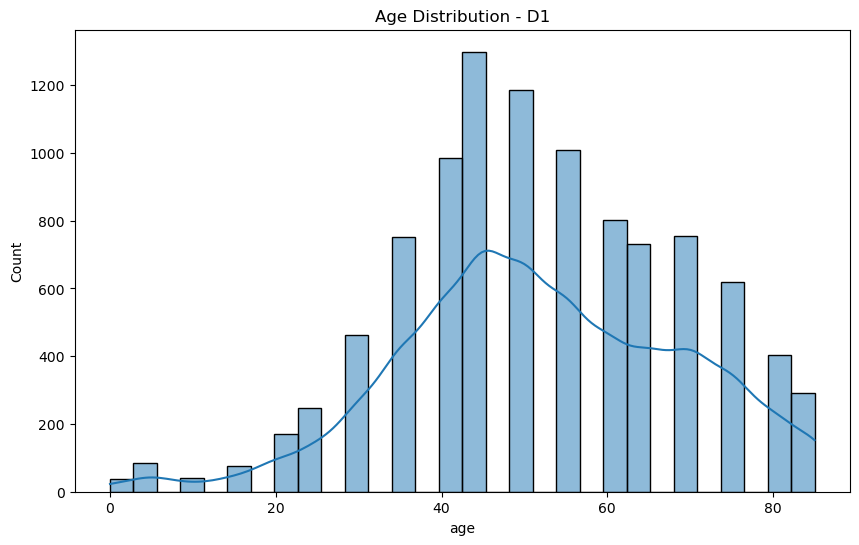

In [ ]:
# رسم توزيع الأعمار في D1
plt.figure(figsize=(10, 6))
sns.histplot(D1['age'], kde=True, bins=30)
plt.title("Age Distribution - D1")
plt.show()

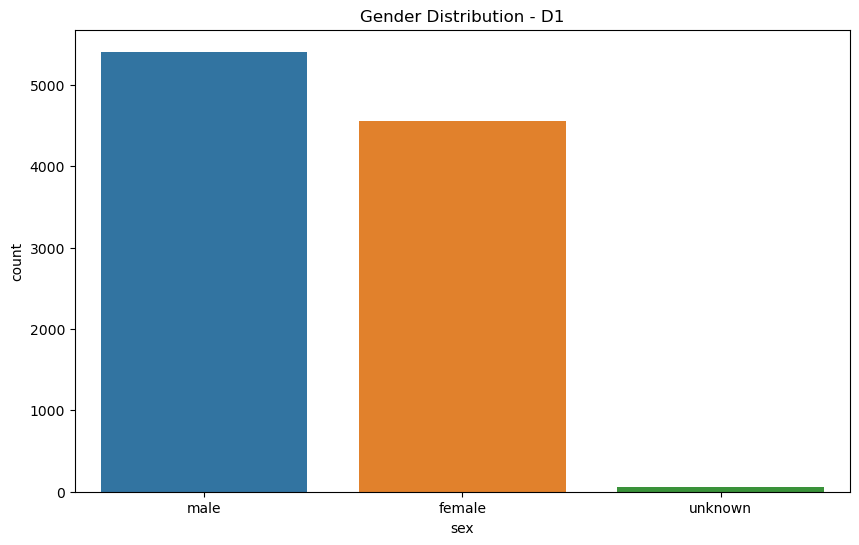

In [ ]:
# رسم توزيع الجنس في D1
plt.figure(figsize=(10, 6))
sns.countplot(data=D1, x='sex')
plt.title("Gender Distribution - D1")
plt.show()

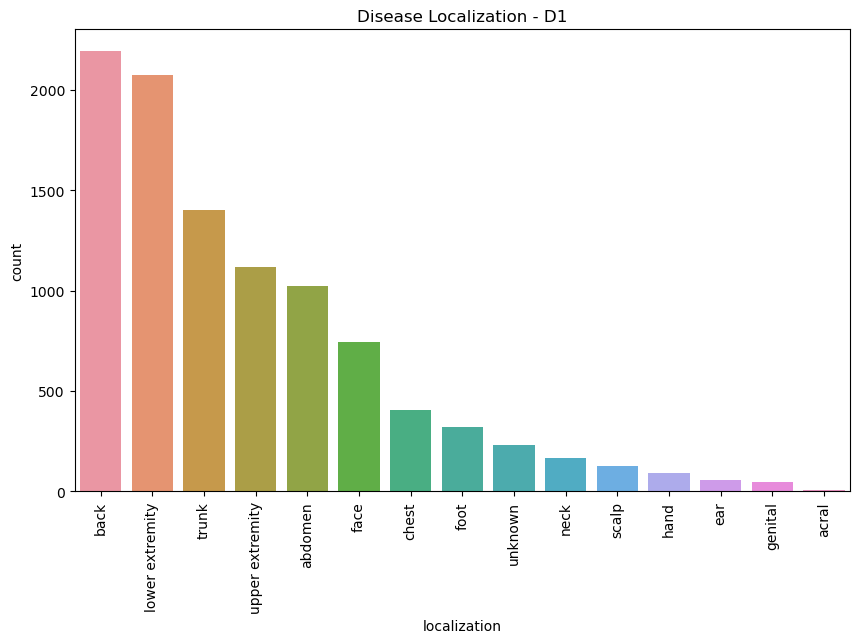

In [ ]:
# رسم توزيع المرض حسب الموقع في D1
plt.figure(figsize=(10, 6))
sns.countplot(data=D1, x='localization', order=D1['localization'].value_counts().index)
plt.title("Disease Localization - D1")
plt.xticks(rotation=90)
plt.show()

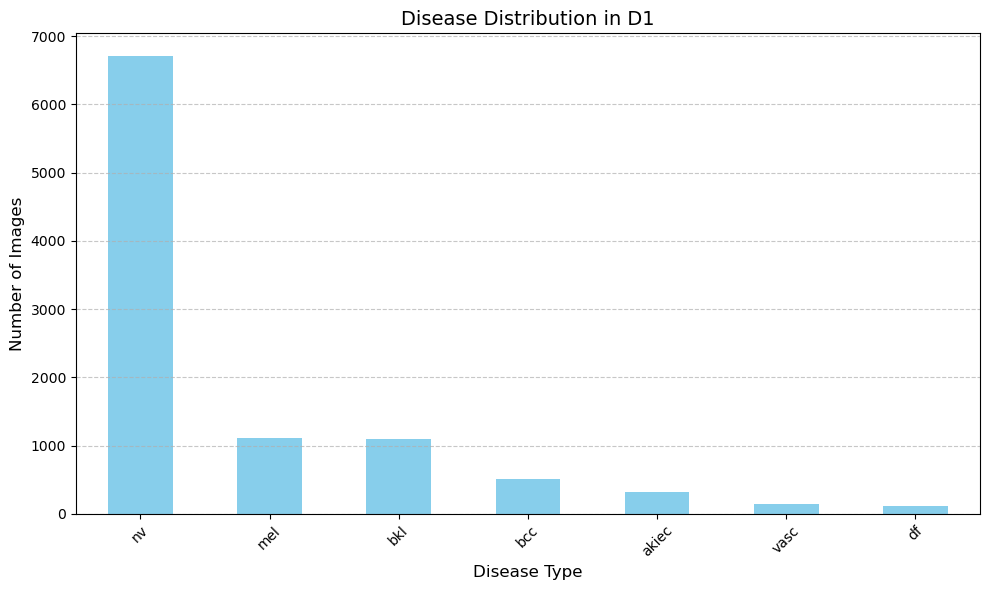

In [ ]:
# تحليل توزيع الأمراض في D1
disease_counts = D1['dx'].value_counts()

# رسم التوزيع
plt.figure(figsize=(10, 6))
disease_counts.plot(kind='bar', color='skyblue')
plt.title("Disease Distribution in D1", fontsize=14)
plt.xlabel("Disease Type", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# التحقق من الصور المفقودة في D1
image_folder = r"D:\datasets\D1\Skin Cancer\Skin Cancer"
image_files = os.listdir(image_folder)
missing_images = set(D1['image_id'] + '.jpg') - set(image_files)

print(f"Number of images in metadata: {len(D1)}")
print(f"Number of images in folder: {len(image_files)}")
print(f"Number of missing images: {len(missing_images)}")


Number of images in metadata: 10015
Number of images in folder: 10015
Number of missing images: 0


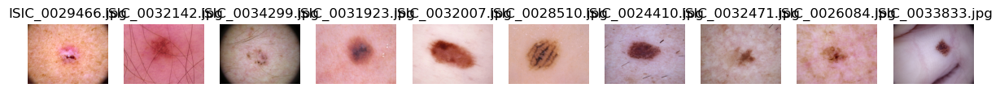

In [ ]:
# عرض بعض الصور الموجودة في المجلد
existing_images_sample = list(set(image_files) & set(D1['image_id'] + '.jpg'))[:10]

# مسار الصور
sample_paths = [os.path.join(image_folder, img) for img in existing_images_sample]

# عرض الصور باستخدام matplotlib
fig, axes = plt.subplots(1, len(sample_paths), figsize=(15, 5))
for ax, img_path in zip(axes, sample_paths):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')  # إخفاء المحاور
    ax.set_title(os.path.basename(img_path))  # عنوان كل صورة هو اسمها

plt.show()

In [ ]:
# التحقق من القيم المفقودة في D1
missing_values = D1.isnull().sum()
print("\nMissing Values per Column - D1:")
print(missing_values)



Missing Values per Column - D1:
lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64


In [ ]:
# حساب النسبة المئوية للقيم المفقودة في D1
missing_percentage = (missing_values / len(D1)) * 100
print("\nPercentage of Missing Values per Column - D1:")
print(missing_percentage)



Percentage of Missing Values per Column - D1:
lesion_id       0.000000
image_id        0.000000
dx              0.000000
dx_type         0.000000
age             0.569146
sex             0.000000
localization    0.000000
dtype: float64


In [ ]:
D1['age'] = D1['age'].fillna(D1['age'].mean())  # ملء العمر بالمتوسط

In [ ]:
print("Missing Values after Cleaning - D1:")
print(D1.isnull().sum())

Missing Values after Cleaning - D1:
lesion_id       0
image_id        0
dx              0
dx_type         0
age             0
sex             0
localization    0
dtype: int64


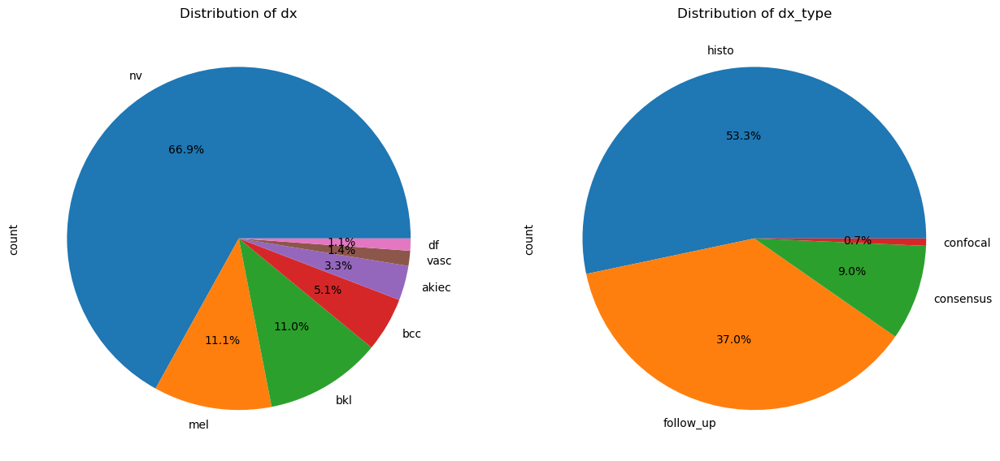

In [ ]:
# تأكد من أن لديك الأعمدة الصحيحة في D1 (dx و dx_type)
plt.figure(figsize=(15, 10))

# الرسم البياني الأول (التوزيع حسب dx)
plt.subplot(1, 2, 1)
D1['dx'].value_counts().plot.pie(autopct="%1.1f%%")
plt.title('Distribution of dx')

# الرسم البياني الثاني (التوزيع حسب dx_type)
plt.subplot(1, 2, 2)
D1['dx_type'].value_counts().plot.pie(autopct="%1.1f%%")
plt.title('Distribution of dx_type')

# عرض الرسم البياني
plt.show()


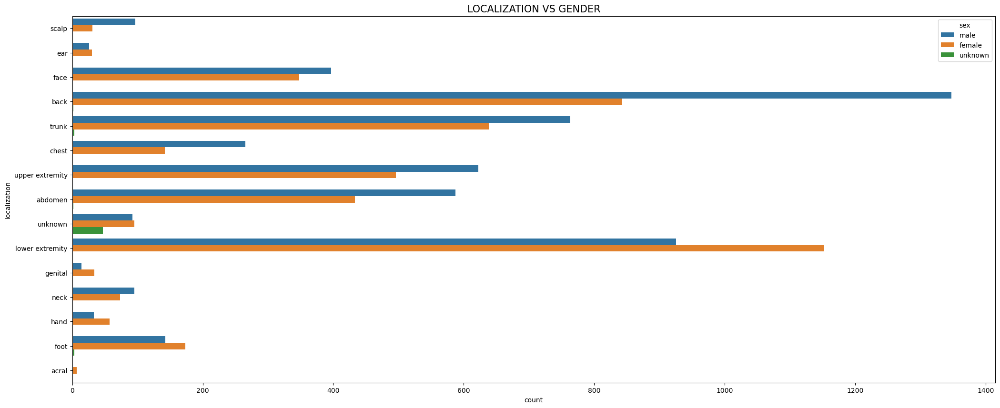

In [ ]:
# رسم المخطط البياني بين localization و sex
plt.figure(figsize=(25, 10))
plt.title('LOCALIZATION VS GENDER', fontsize=15)

# استخدام countplot من seaborn لرسم التوزيع
sns.countplot(y='localization', hue='sex', data=D1)  # تأكد أن `D1` يحتوي على الأعمدة المطلوبة

# عرض الرسم البياني
plt.show()

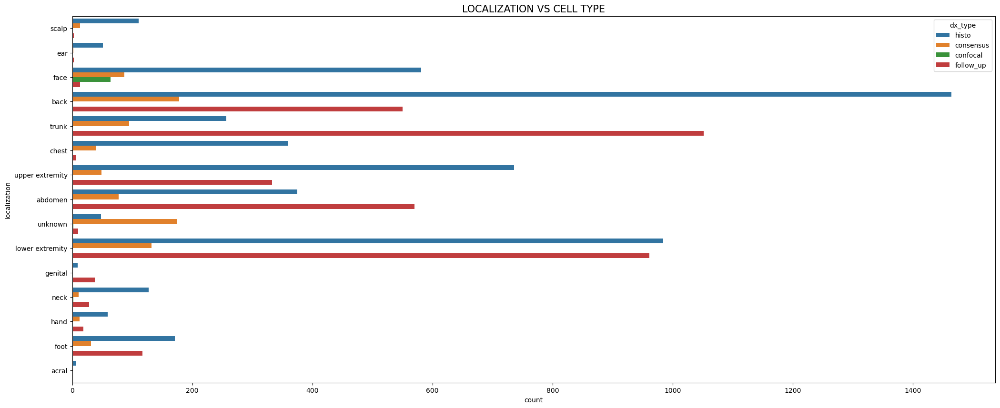

In [ ]:
# رسم المخطط البياني بين localization و cell_type
plt.figure(figsize=(25, 10))
plt.title('LOCALIZATION VS CELL TYPE', fontsize=15)
sns.countplot(y='localization', hue='dx_type', data=D1)  # تأكد أن `D1` يحتوي على الأعمدة المطلوبة
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

# تحديد الأعمدة المدخلة (الميزات) والهدف (target)
X_D1 = D1[['lesion_id', 'image_id', 'dx_type', 'age', 'sex', 'localization']]  # الأعمدة المدخلة
y_D1 = D1['dx']  # الهدف (التصنيف)

# تقسيم البيانات إلى 80% تدريب و 20% اختبار
X_train_D1, X_test_D1, y_train_D1, y_test_D1 = train_test_split(X_D1, y_D1, test_size=0.2, random_state=42)

# عرض الشكل النهائي للبيانات المقسمة
print("Training Data:", X_train_D1.shape)
print("Test Data:", X_test_D1.shape)


Training Data: (8012, 6)
Test Data: (2003, 6)


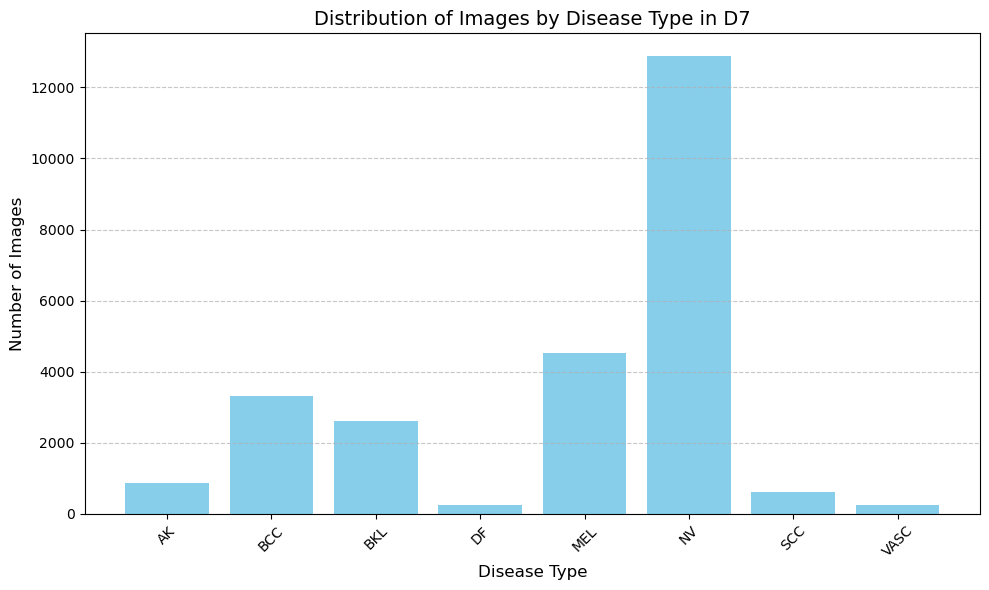

In [ ]:
D7_1 = pd.read_csv(r"D:\datasets\D7\ISIC_2019_Training_GroundTruth.csv")
D7_2 = pd.read_csv(r"D:\datasets\D7\ISIC_2019_Training_Metadata.csv")

# حساب عدد الصور في مجلدات الأمراض في D7
path_to_disease_folders = r"D:\datasets\D7"
folders = ["AK", "BCC", "BKL", "DF", "MEL", "NV", "SCC", "VASC"]

disease_counts = {folder: len(os.listdir(os.path.join(path_to_disease_folders, folder))) for folder in folders}

# رسم توزيع الصور حسب نوع المرض في D7
plt.figure(figsize=(10, 6))
plt.bar(disease_counts.keys(), disease_counts.values(), color='skyblue')
plt.title("Distribution of Images by Disease Type in D7", fontsize=14)
plt.xlabel("Disease Type", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# الحصول على قائمة الصور من المجلدات
image_files = []
for folder in folders:
    folder_path = os.path.join(path_to_disease_folders, folder)
    image_files.extend(os.listdir(folder_path))  # إضافة كل الصور في المجلد

# التحقق من تطابق IDs الصور مع البيانات الوصفية
image_ids_from_metadata = set(D7_1['image'])  # استخدام عمود 'image' من D7_1
image_ids_in_folders = set([img.split('.')[0] for img in image_files])  # افتراض أن الامتداد هو .jpg

# العثور على الصور المفقودة أو غير المطابقة
missing_images = image_ids_from_metadata - image_ids_in_folders
extra_images = image_ids_in_folders - image_ids_from_metadata

print(f"Number of images in metadata: {len(image_ids_from_metadata)}")
print(f"Number of images in folders: {len(image_ids_in_folders)}")
print(f"Number of missing images: {len(missing_images)}")
print(f"Number of extra images: {len(extra_images)}")


Number of images in metadata: 25331
Number of images in folders: 25331
Number of missing images: 0
Number of extra images: 0


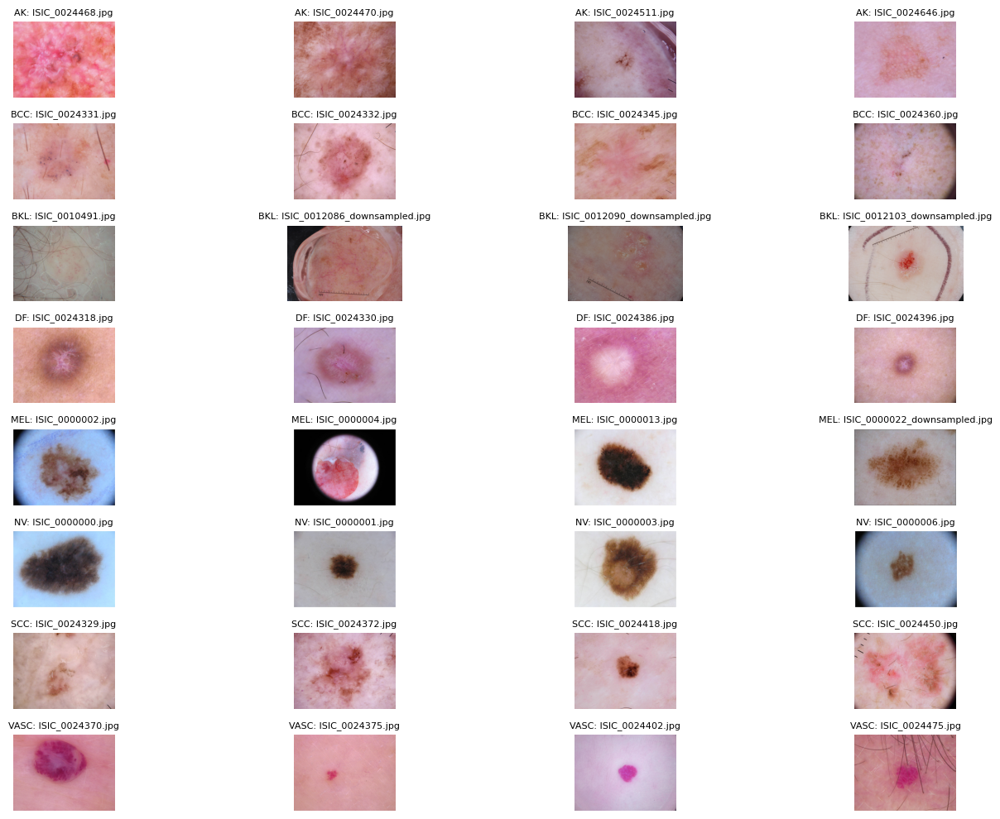

In [ ]:
path_to_disease_folders = r"D:\datasets\D7"
folders = ["AK", "BCC", "BKL", "DF", "MEL", "NV", "SCC", "VASC"]

# عدد الصور المراد عرضها من كل فولدر
num_images_per_folder = 4

# إنشاء الرسم
fig, axes = plt.subplots(len(folders), num_images_per_folder, figsize=(15, 10))

for i, folder in enumerate(folders):
    folder_path = os.path.join(path_to_disease_folders, folder)
    if os.path.exists(folder_path):
        images = [img for img in os.listdir(folder_path) if img.endswith(('.png', '.jpg', '.jpeg'))]
        selected_images = images[:num_images_per_folder]  # اختيار أول 3 صور

        for j, img_name in enumerate(selected_images):
            img_path = os.path.join(folder_path, img_name)
            img = Image.open(img_path)  # فتح الصورة

            # عرض الصورة
            axes[i, j].imshow(img)
            axes[i, j].axis('off')  # إخفاء المحاور
            axes[i, j].set_title(f"{folder}: {img_name}", fontsize=8)
    else:
        print(f"Folder not found: {folder}")
        for j in range(num_images_per_folder):
            axes[i, j].axis('off')  # إخفاء المحاور إذا لم يكن الفولدر موجودًا
            axes[i, j].set_title(f"Missing: {folder}", fontsize=8)

plt.tight_layout()
plt.show()

In [ ]:
# التحقق من القيم المفقودة في D7_2
missing_values_d7_2 = D7_2.isnull().sum()
print("\nMissing Values per Column - D7_2:")
print(missing_values_d7_2)


Missing Values per Column - D7_2:
image                     0
age_approx              437
anatom_site_general    2631
lesion_id              2084
sex                     384
dtype: int64


In [ ]:
D7_2['age_approx'] = D7_2['age_approx'].fillna(D7_2['age_approx'].mean())
D7_2['anatom_site_general'] = D7_2['anatom_site_general'].fillna('unknown')
D7_2['sex'] = D7_2['sex'].fillna(D7_2['sex'].mode()[0])
D7_2['lesion_id'] = D7_2['lesion_id'].fillna('unknown')
print("\nMissing Values after Cleaning - D7_2:")
print(D7_2.isnull().sum())


Missing Values after Cleaning - D7_2:
image                  0
age_approx             0
anatom_site_general    0
lesion_id              0
sex                    0
dtype: int64


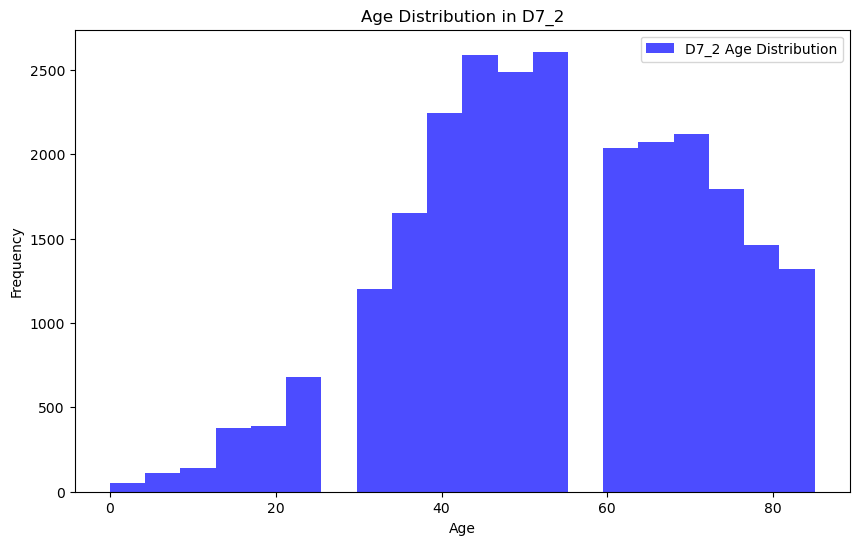

In [ ]:
# رسم توزيع الأعمار في D7_2
plt.figure(figsize=(10, 6))
plt.hist(D7_2['age_approx'], bins=20, alpha=0.7, color='blue', label='D7_2 Age Distribution')
plt.title('Age Distribution in D7_2')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.legend()
plt.show()

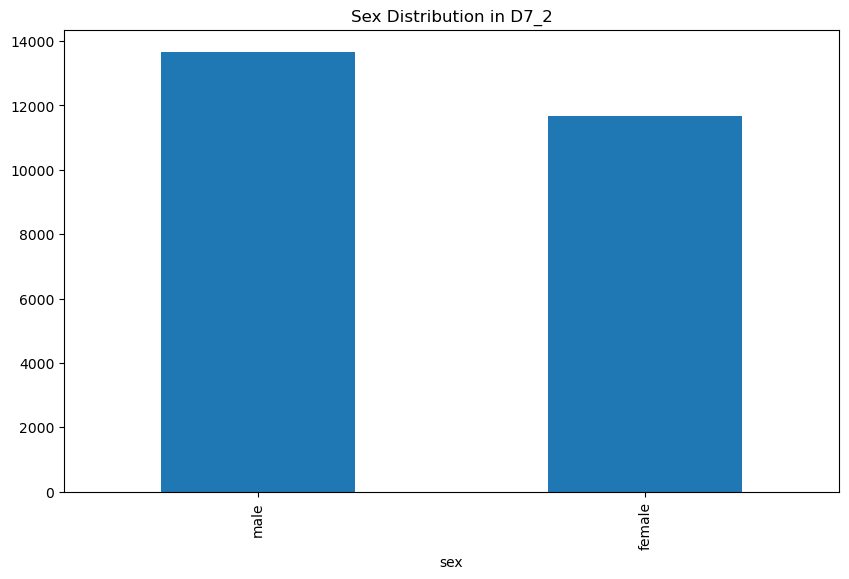

In [ ]:
# رسم توزيع الجنس في D7_2
plt.figure(figsize=(10, 6))
D7_2['sex'].value_counts().plot(kind='bar', title='Sex Distribution in D7_2')
plt.show()


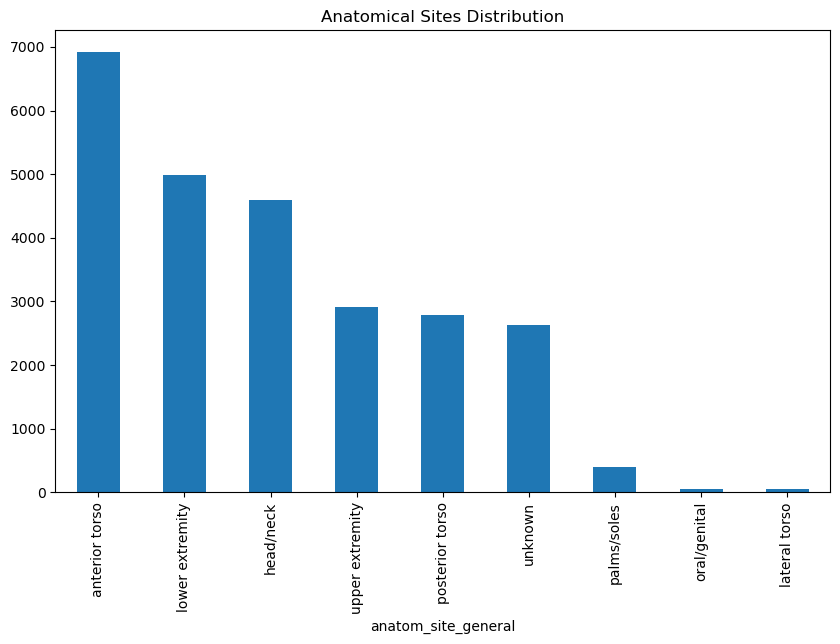

In [ ]:
# رسم توزيع المواقع التشريحية في D7_2
plt.figure(figsize=(10, 6))
D7_2['anatom_site_general'].value_counts().plot(kind='bar', title='Anatomical Sites Distribution')
plt.show()

In [ ]:
# تحديد الأعمدة المدخلة (الميزات) والهدف (المرض)
X_D7 = D7_2[['image', 'age_approx', 'lesion_id', 'sex']]  # الأعمدة المدخلة
y_D7 = D7_2['anatom_site_general']  # الهدف (نوع المرض)

# تقسيم البيانات إلى 80% تدريب و 20% اختبار
X_train_D7, X_test_D7, y_train_D7, y_test_D7 = train_test_split(X_D7, y_D7, test_size=0.2, random_state=42)

# عرض الشكل النهائي للبيانات المقسمة
print("Training Data D7:", X_train_D7.shape)
print("Test Data D7:", X_test_D7.shape)


Training Data D7: (20264, 4)
Test Data D7: (5067, 4)


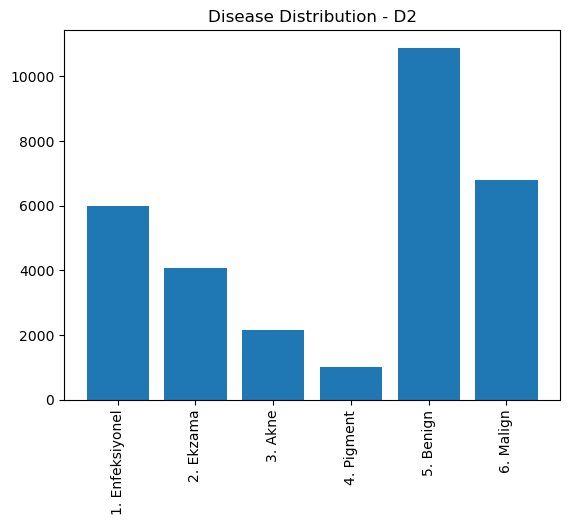

In [ ]:
D2 = r"D:\datasets\D2\kaggle\train"

# قراءة الفولدرات
disease_folders = os.listdir(D2)

# استخراج عدد الصور لكل مرض
disease_counts = {folder: len(os.listdir(os.path.join(D2, folder))) for folder in disease_folders}

# عرض توزيع الأمراض
plt.bar(disease_counts.keys(), disease_counts.values())
plt.title("Disease Distribution - D2")
plt.xticks(rotation=90)
plt.show()

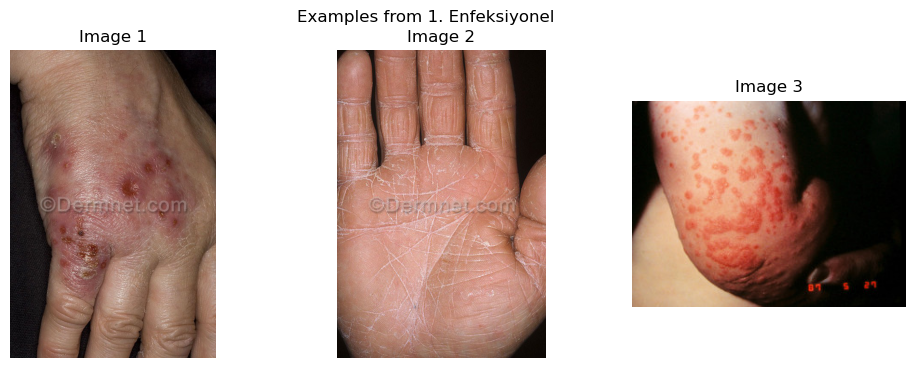

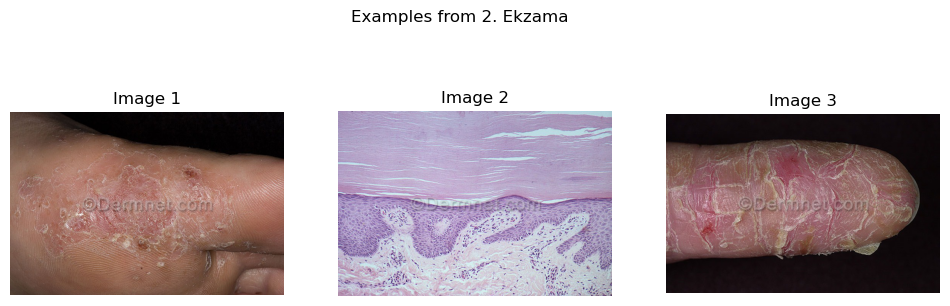

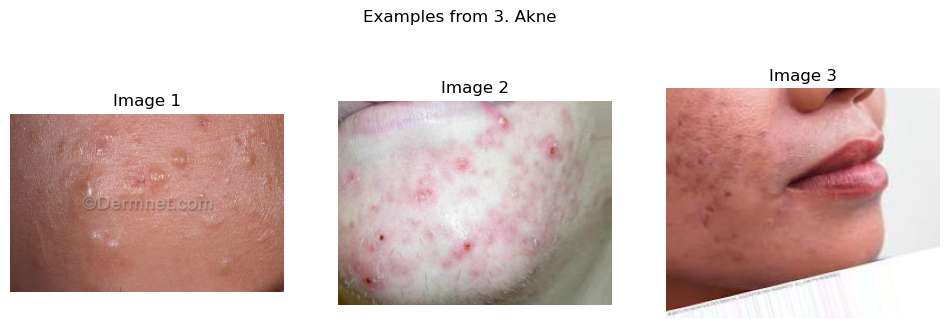

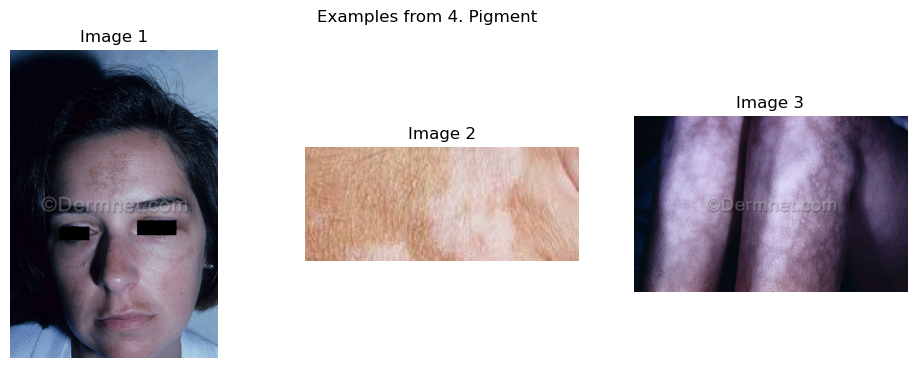

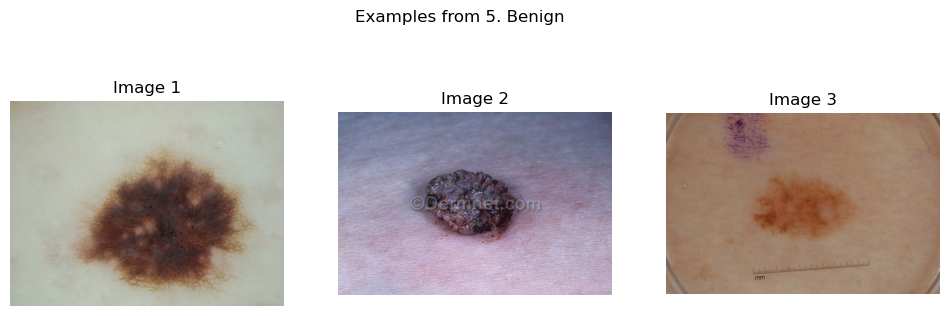

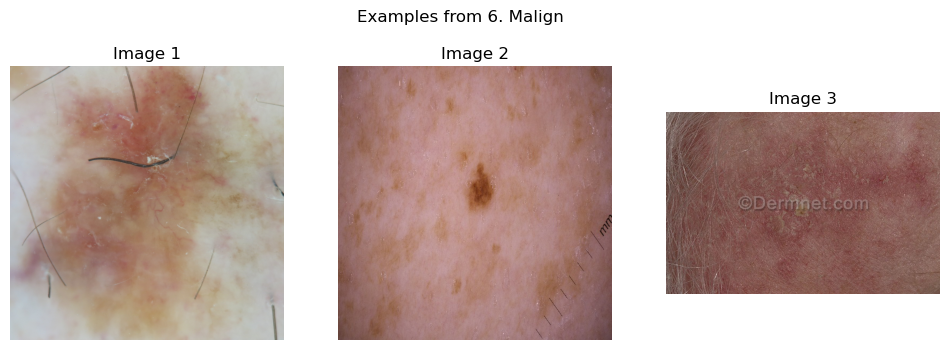

In [ ]:
# عرض بعض الصور من D2
num_images_to_show = 3
for folder in disease_folders:
    folder_path = os.path.join(D2, folder)
    images = os.listdir(folder_path)
    selected_images = random.sample(images, num_images_to_show)

    fig, axes = plt.subplots(1, num_images_to_show, figsize=(12, 4))
    fig.suptitle(f"Examples from {folder}")

    for i, img_name in enumerate(selected_images):
        img = mpimg.imread(os.path.join(folder_path, img_name))
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

    plt.show()

In [ ]:
data = []

# قراءة الصور والتسميات
for folder in disease_folders:
    folder_path = os.path.join(D2, folder)
    images = os.listdir(folder_path)

    for img_name in images:
        data.append({"image": img_name, "disease": folder})

# إنشاء DataFrame
df = pd.DataFrame(data)

# عرض بعض البيانات
print(df.head())

                         image          disease
0      03cheilitis05010422.jpg  1. Enfeksiyonel
1      03ContactDerm050127.jpg  1. Enfeksiyonel
2       09cellulitis032706.jpg  1. Enfeksiyonel
3   09EczemaInfected062804.jpg  1. Enfeksiyonel
4  09EczemaInfected0628041.jpg  1. Enfeksiyonel


In [ ]:
# التحقق من القيم المفقودة في D2
print(df.isnull().sum())


image      0
disease    0
dtype: int64


In [ ]:
# تقسيم البيانات إلى تدريب واختبار
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# عرض عدد العينات في التدريب والاختبار
print(f"Training Data: {len(train_df)} samples")
print(f"Testing Data: {len(test_df)} samples")

Training Data: 24728 samples
Testing Data: 6182 samples


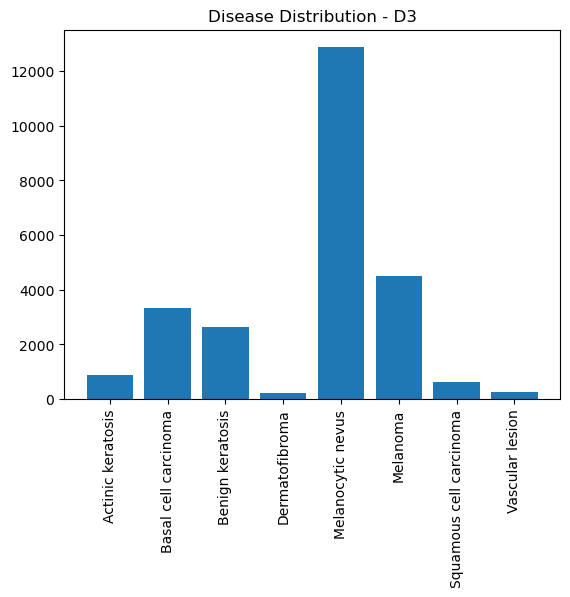

In [ ]:
data_path_D3 = r"D:\datasets\D3\ISIC_Labelled"

# قراءة الفولدرات
disease_folders = os.listdir(data_path_D3)

# استخراج عدد الصور لكل مرض
disease_counts = {folder: len(os.listdir(os.path.join(data_path_D3, folder))) for folder in disease_folders}

# عرض توزيع الأمراض
plt.bar(disease_counts.keys(), disease_counts.values())
plt.title("Disease Distribution - D3")
plt.xticks(rotation=90)
plt.show()

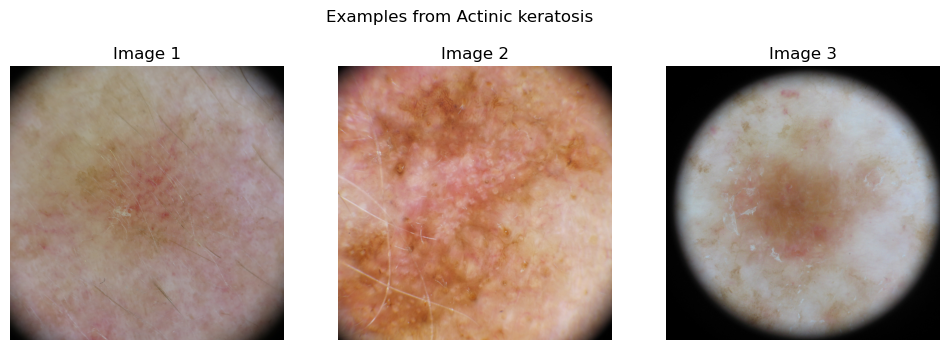

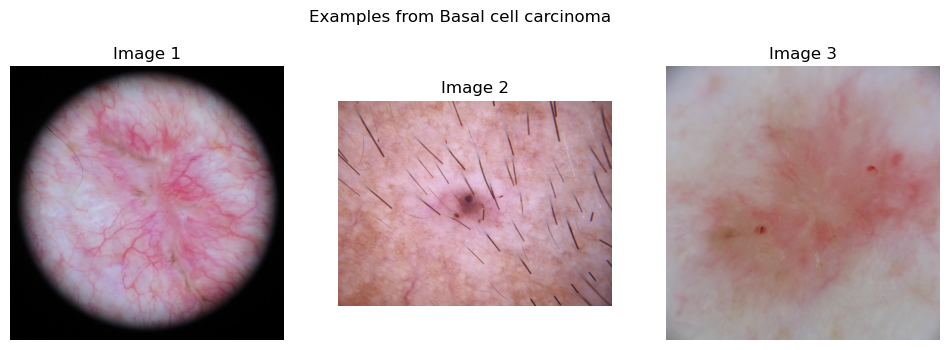

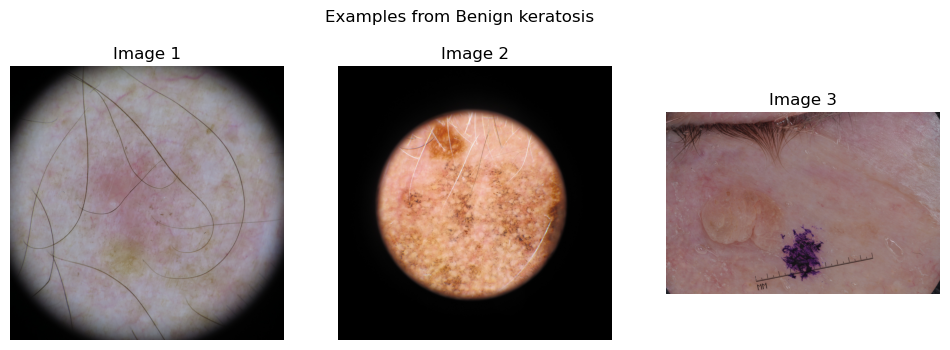

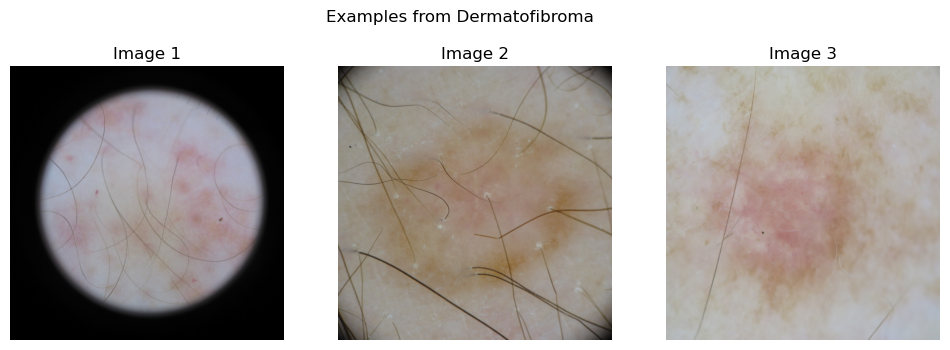

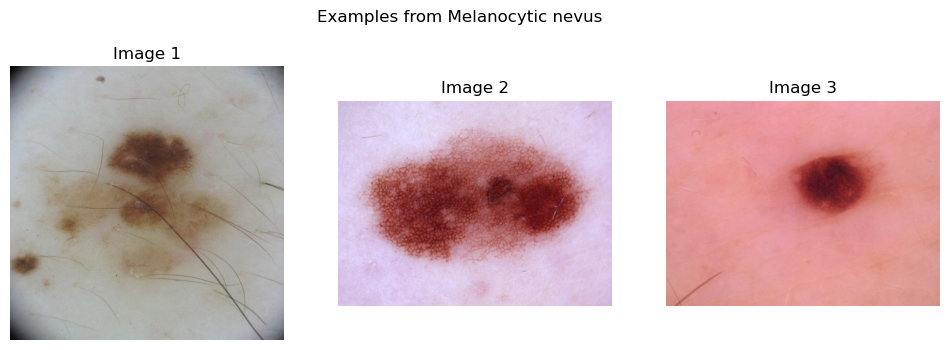

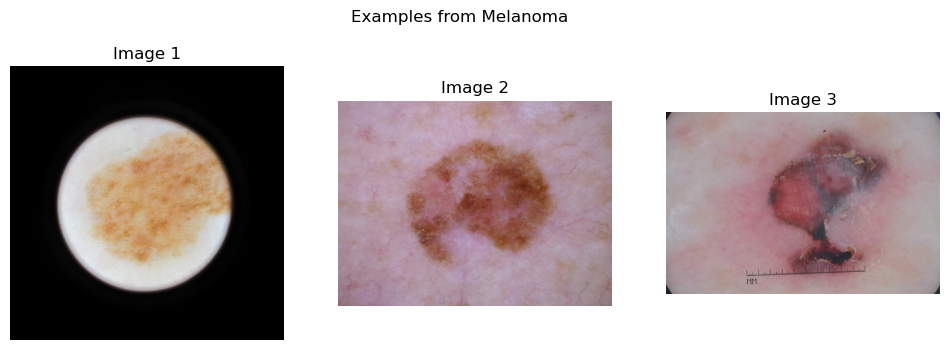

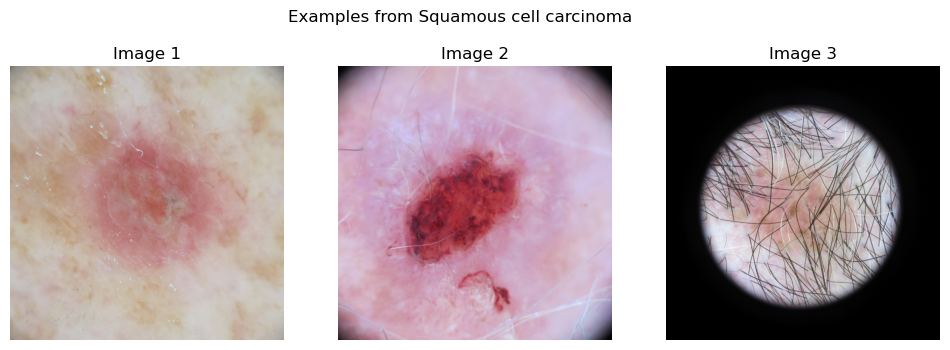

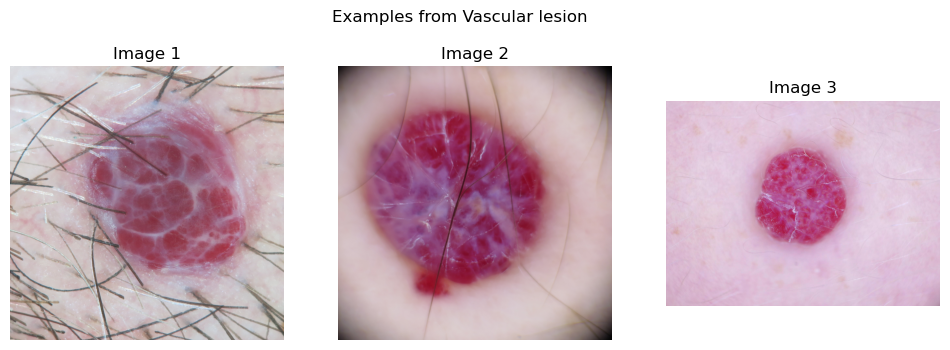

In [ ]:
# تحديد عدد الصور التي نريد عرضها من كل فولدر
num_images_to_show = 3

# عرض صور من كل فولدر
for folder in disease_folders:
    folder_path = os.path.join(data_path_D3, folder)

    # استخراج أسماء الصور
    images = os.listdir(folder_path)

    # اختيار بعض الصور بشكل عشوائي
    selected_images = random.sample(images, num_images_to_show)

    # عرض الصور
    fig, axes = plt.subplots(1, num_images_to_show, figsize=(12, 4))
    fig.suptitle(f"Examples from {folder}")

    for i, img_name in enumerate(selected_images):
        img = mpimg.imread(os.path.join(folder_path, img_name))
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

    plt.show()


In [ ]:
data = []

# قراءة الصور والتسميات
for folder in disease_folders:
    folder_path = os.path.join(data_path_D3, folder)
    images = os.listdir(folder_path)

    for img_name in images:
        data.append({"image": img_name, "disease": folder})

# إنشاء DataFrame
df = pd.DataFrame(data)

# عرض بعض البيانات
print(df.head())

              image            disease
0  ISIC_0024468.jpg  Actinic keratosis
1  ISIC_0024470.jpg  Actinic keratosis
2  ISIC_0024511.jpg  Actinic keratosis
3  ISIC_0024646.jpg  Actinic keratosis
4  ISIC_0024654.jpg  Actinic keratosis


In [ ]:
print(df.isnull().sum())

image      0
disease    0
dtype: int64


In [ ]:
# تقسيم البيانات إلى تدريب واختبار
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# عرض عدد العينات في التدريب والاختبار
print(f"Training Data: {len(train_df)} samples")
print(f"Testing Data: {len(test_df)} samples")

Training Data: 20264 samples
Testing Data: 5067 samples


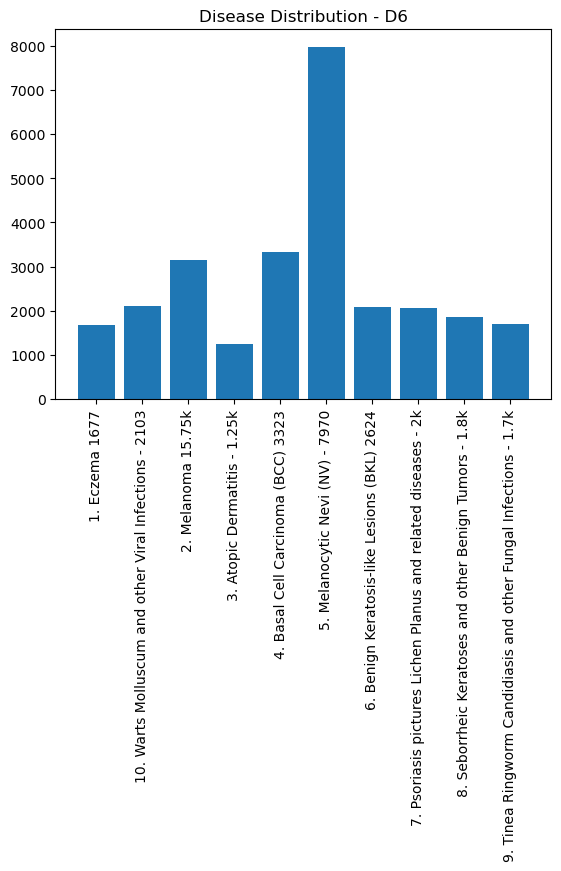

In [ ]:
data_path_D6 = r"D:\datasets\D6\IMG_CLASSES"

# قراءة الفولدرات
disease_folders = os.listdir(data_path_D6)

# استخراج عدد الصور لكل مرض
disease_counts = {folder: len(os.listdir(os.path.join(data_path_D6, folder))) for folder in disease_folders}

# عرض توزيع الأمراض
plt.bar(disease_counts.keys(), disease_counts.values())
plt.title("Disease Distribution - D6")
plt.xticks(rotation=90)
plt.show()

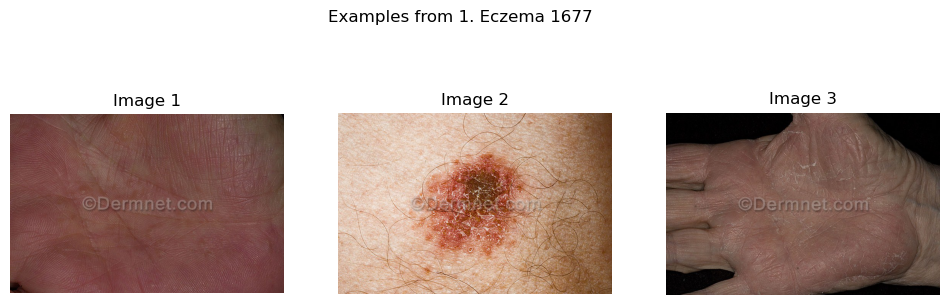

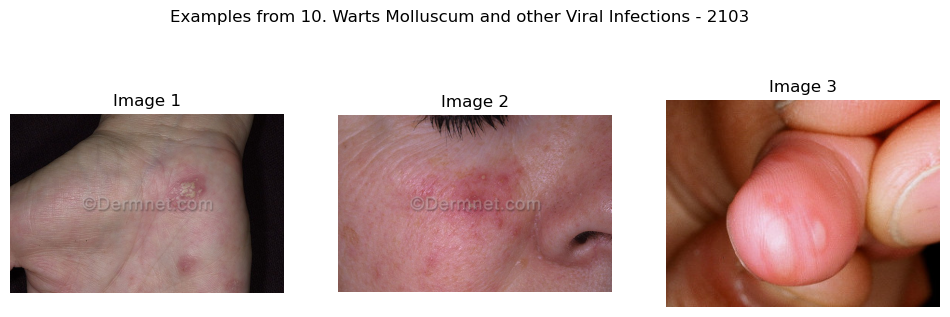

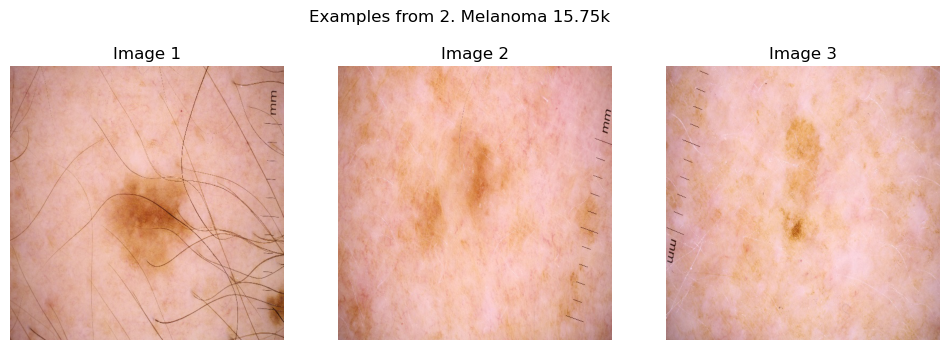

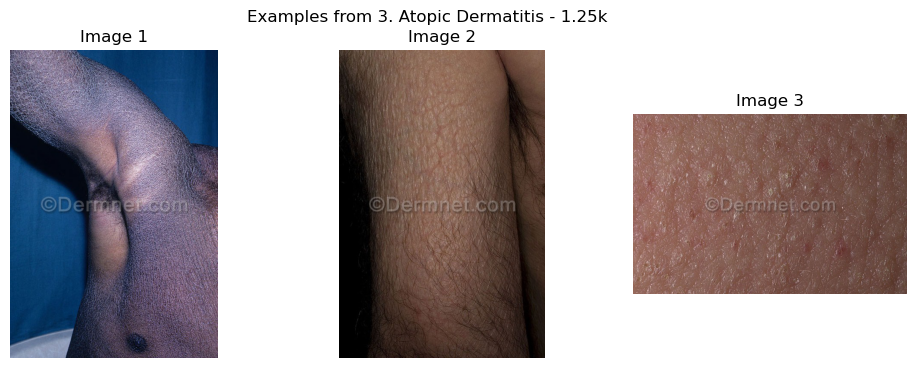

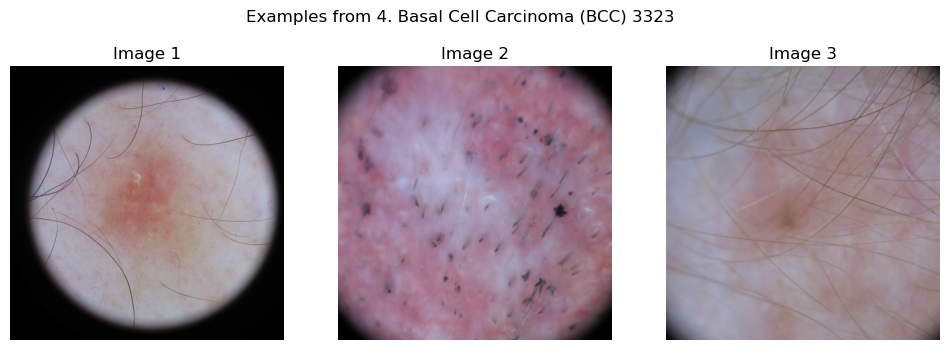

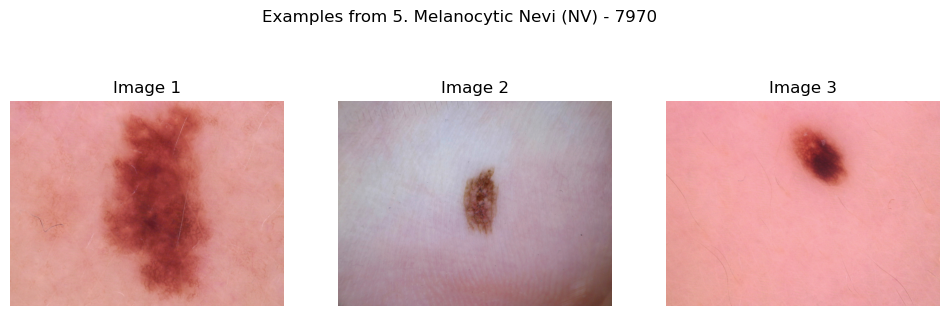

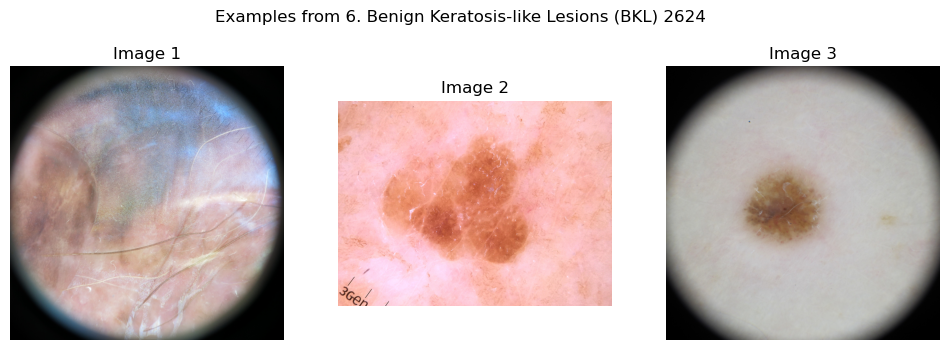

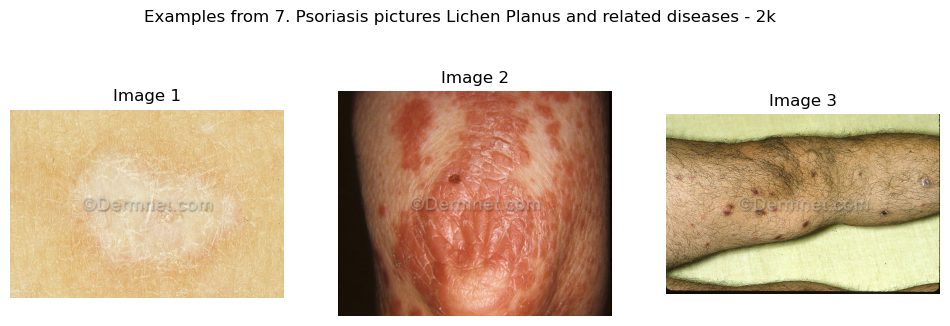

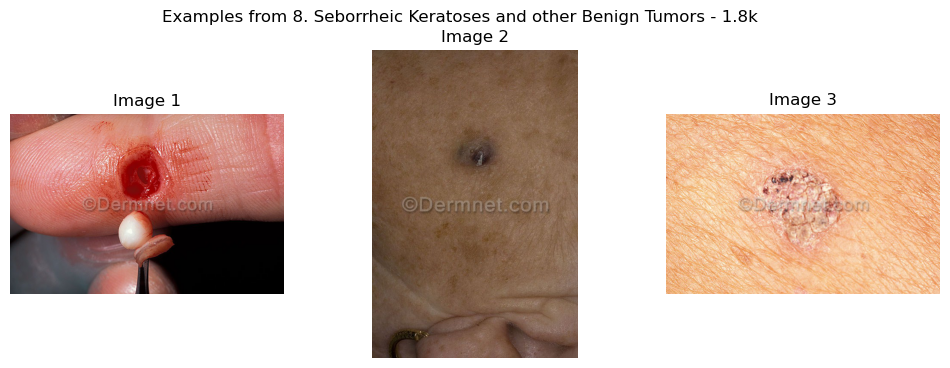

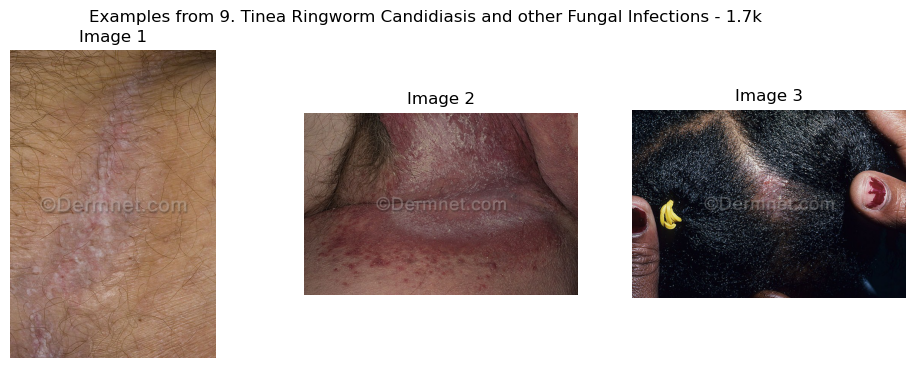

In [ ]:


# تحديد عدد الصور التي نريد عرضها من كل فولدر
num_images_to_show = 3

# عرض صور من كل فولدر
for folder in disease_folders:
    folder_path = os.path.join(data_path_D6, folder)

    # استخراج أسماء الصور
    images = os.listdir(folder_path)

    # اختيار بعض الصور بشكل عشوائي
    selected_images = random.sample(images, num_images_to_show)

    # عرض الصور
    fig, axes = plt.subplots(1, num_images_to_show, figsize=(12, 4))
    fig.suptitle(f"Examples from {folder}")

    for i, img_name in enumerate(selected_images):
        img = mpimg.imread(os.path.join(folder_path, img_name))
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

    plt.show()


In [ ]:
data = []

# قراءة الصور والتسميات
for folder in disease_folders:
    folder_path = os.path.join(data_path_D6, folder)
    images = os.listdir(folder_path)

    for img_name in images:
        data.append({"image": img_name, "disease": folder})

# إنشاء DataFrame
df = pd.DataFrame(data)

# عرض بعض البيانات
print(df.head())

      image         disease
0   0_0.jpg  1. Eczema 1677
1   0_1.jpg  1. Eczema 1677
2  0_10.jpg  1. Eczema 1677
3  0_11.jpg  1. Eczema 1677
4  0_12.jpg  1. Eczema 1677


In [ ]:
# التحقق من القيم المفقودة
print(df.isnull().sum())

image      0
disease    0
dtype: int64


In [ ]:
from sklearn.model_selection import train_test_split

# تقسيم البيانات
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# عرض عدد العينات في التدريب والاختبار
print(f"Training Data: {len(train_df)} samples")
print(f"Testing Data: {len(test_df)} samples")


Training Data: 21722 samples
Testing Data: 5431 samples


In [ ]:
import pandas as pd
import os

# تحميل البيانات
image_folder = r"D:\datasets\D1\Skin Cancer\Skin Cancer"
D1 = pd.read_csv(r"D:\datasets\D1\HAM10000_metadata.csv")

# إضافة مسار الصورة
D1['image_path'] = D1['image_id'].apply(lambda x: os.path.join(image_folder, f"{x}.jpg"))

# عرض البيانات للتأكد
print(D1.head())


     lesion_id      image_id   dx dx_type   age   sex localization  \
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp   
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp   
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp   
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp   
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear   

                                          image_path  
0  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
1  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
2  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
3  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
4  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  


In [ ]:
# تحويل التصنيفات إلى أرقام
D1['label'] = D1['dx'].astype('category').cat.codes

# عرض التصنيفات
print(D1[['dx', 'label']].drop_duplicates())


         dx  label
0       bkl      2
64       nv      5
1095     df      3
1211    mel      4
2320   vasc      6
2462    bcc      1
9687  akiec      0


In [ ]:
D1['sex'] = D1['sex'].map({'male': 0, 'female': 1})


In [ ]:
D1['localization'] = D1['localization'].astype('category').cat.codes


In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(
    D1,
    test_size=0.2,
    stratify=D1['label'],
    random_state=42
)

print(f"Train size: {len(train_data)}, Test size: {len(test_data)}")


Train size: 8012, Test size: 2003


Train images shape: (32, 224, 224, 3), Train labels shape: (32,)
Test images shape: (32, 224, 224, 3), Test labels shape: (32,)


In [ ]:
# مسارات الملفات
d1_excel_path = r"D:\datasets\D1\HAM10000_metadata.csv"
d1_image_folder = r"D:\datasets\D1\Skin Cancer\Skin Cancer"

# تحميل البيانات
d1 = pd.read_csv(d1_excel_path)

# إضافة المسار الكامل للصور
d1['image_path'] = d1['image_id'].apply(lambda x: os.path.join(d1_image_folder, f"{x}.jpg"))

# التحقق من الصور الموجودة فقط
d1 = d1[d1['image_path'].apply(os.path.exists)]
print(f"Loaded D1 dataset: {len(d1)} images")
print(d1.head())

Loaded D1 dataset: 10015 images
     lesion_id      image_id   dx dx_type   age   sex localization  \
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp   
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp   
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp   
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp   
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear   

                                          image_path  
0  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
1  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
2  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
3  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  
4  D:\datasets\D1\Skin Cancer\Skin Cancer\ISIC_00...  


In [ ]:
path_to_disease_folders = r"D:\datasets\D7"
folders = ["AK", "BCC", "BKL", "DF", "MEL", "NV", "SCC", "VASC"]

# قائمة لتخزين البيانات
data = []

# قراءة الصور من كل فولدر
for folder in folders:
    folder_path = os.path.join(path_to_disease_folders, folder)
    if os.path.exists(folder_path):
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)
            if file_name.lower().endswith(('.jpg', '.png', '.jpeg')):  # التحقق من الصور فقط
                data.append({'image_path': file_path, 'label': folder})

# تحويل القائمة إلى DataFrame
d7_images_data = pd.DataFrame(data)

print(f"Loaded D7 dataset: {len(d7_images_data)} images")
print(d7_images_data.head())

Loaded D7 dataset: 25331 images
                           image_path label
0  D:\datasets\D7\AK\ISIC_0024468.jpg    AK
1  D:\datasets\D7\AK\ISIC_0024470.jpg    AK
2  D:\datasets\D7\AK\ISIC_0024511.jpg    AK
3  D:\datasets\D7\AK\ISIC_0024646.jpg    AK
4  D:\datasets\D7\AK\ISIC_0024654.jpg    AK


In [ ]:
#تغيير الحجم (Resizing)
def resize_image(img, target_size=(224, 224)):
    return cv2.resize(img, target_size)


In [ ]:
#التحويل إلى التدرج الرمادي (Grayscale)
def convert_to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


In [ ]:
#تحسين التباين (Histogram Equalization)
def equalize_histogram(img):
    return cv2.equalizeHist(img)


In [ ]:
# إزالة الضوضاء (Gaussian Blur)
def apply_gaussian_blur(img, kernel_size=(5, 5)):
    return cv2.GaussianBlur(img, kernel_size, 0)


In [ ]:
#التطبيع (Normalization)
def normalize_image(img):
    return img / 255.0


In [ ]:
#التدوير العشوائي (Random Rotation)
def random_rotation(img, angle_range=30):
    angle = np.random.uniform(-angle_range, angle_range)
    center = (img.shape[1] // 2, img.shape[0] // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, rot_matrix, (img.shape[1], img.shape[0]))


In [ ]:
#التغيير في الإضاءة (Random Brightness Change)
def random_brightness(img, factor=0.2):
    brightness_factor = np.random.uniform(1 - factor, 1 + factor)
    return np.clip(img * brightness_factor, 0, 255).astype(np.uint8)


In [ ]:
#التغيير في التدوير (Random Zoom)
def random_zoom(img, zoom_range=0.2):
    h, w = img.shape[:2]
    zoom_factor = np.random.uniform(1 - zoom_range, 1 + zoom_range)
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    resized_img = cv2.resize(img, (new_w, new_h))
    start_x = (new_w - w) // 2
    start_y = (new_h - h) // 2
    return resized_img[start_y:start_y+h, start_x:start_x+w]


In [ ]:
def augment_image(img, target_size=(224, 224)):
    img = random_rotation(img)
    img = random_brightness(img)
    img = random_zoom(img)
    return resize_image(img, target_size)

In [ ]:
def process_images(data_path_D6, target_size=(224, 224)):
    disease_folders = os.listdir(data_path_D6)
    all_images = []
    all_labels = []

    for folder in disease_folders:
        folder_path = os.path.join(data_path_D6, folder)
        for image_name in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_name)
            img = cv2.imread(image_path)

            # تطبيق جميع عمليات المعالجة
            img = resize_image(img, target_size)
            img = convert_to_gray(img)
            img = equalize_histogram(img)
            img = apply_gaussian_blur(img)
            img = normalize_image(img)
            img = augment_image(img)  # التوسيع العشوائي للبيانات

            all_images.append(img)
            all_labels.append(folder)

    return np.array(all_images), np.array(all_labels)

In [8]:
from google.colab import drive
drive.mount('/content/drive')
# تحديد مسار المجلد الرئيسي للداتا سيت
main_dir = '/content/drive/My Drive/Colab Notebooks/D6/IMG_CLASSES'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
import os

# تحديد مسار المجلد الرئيسي للداتا سيت
main_dir = '/content/drive/My Drive/Colab Notebooks/D6/IMG_CLASSES'
# عرض أسماء الفئات (المجلدات الفرعية)
categories = os.listdir(main_dir)
print("Categories:", categories)

# عرض عدد الصور في كل فئة
for category in categories:
    category_path = os.path.join(main_dir, category)
    num_images = len(os.listdir(category_path))
    print(f"{category}: {num_images} images")


Categories: ['1. Eczema 1677', '10. Warts Molluscum and other Viral Infections - 2103', '4. Basal Cell Carcinoma (BCC) 3323', '7. Psoriasis pictures Lichen Planus and related diseases - 2k', '9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k', '2. Melanoma 15.75k', '8. Seborrheic Keratoses and other Benign Tumors - 1.8k', '3. Atopic Dermatitis - 1.25k', '5. Melanocytic Nevi (NV) - 7970', '6. Benign Keratosis-like Lesions (BKL) 2624']
1. Eczema 1677: 108 images
10. Warts Molluscum and other Viral Infections - 2103: 30 images
4. Basal Cell Carcinoma (BCC) 3323: 30 images
7. Psoriasis pictures Lichen Planus and related diseases - 2k: 30 images
9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k: 20 images
2. Melanoma 15.75k: 40 images
8. Seborrheic Keratoses and other Benign Tumors - 1.8k: 30 images
3. Atopic Dermatitis - 1.25k: 40 images
5. Melanocytic Nevi (NV) - 7970: 30 images
6. Benign Keratosis-like Lesions (BKL) 2624: 40 images


In [20]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# إعداد مولّد البيانات
datagen = ImageDataGenerator(
    rescale=1.0/255,  # إعادة تحجيم القيم بين 0 و 1
    validation_split=0.2  # تقسيم البيانات إلى تدريب وتحقق
)

# تحميل بيانات التدريب
train_data = datagen.flow_from_directory(
    main_dir,
    target_size=(150, 150),  # حجم الصور المطلوب
    batch_size=32,
    class_mode='categorical',  # تصنيفات متعددة
    subset='training'
)

# تحميل بيانات التحقق
val_data = datagen.flow_from_directory(
    main_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)


Found 319 images belonging to 10 classes.
Found 79 images belonging to 10 classes.


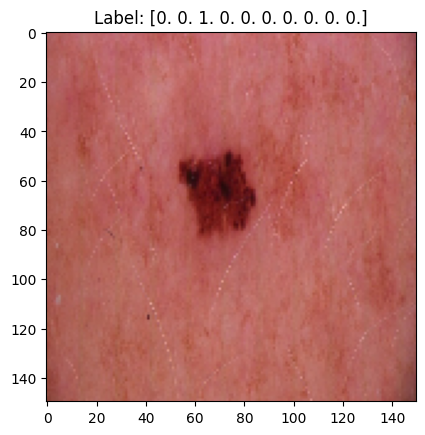

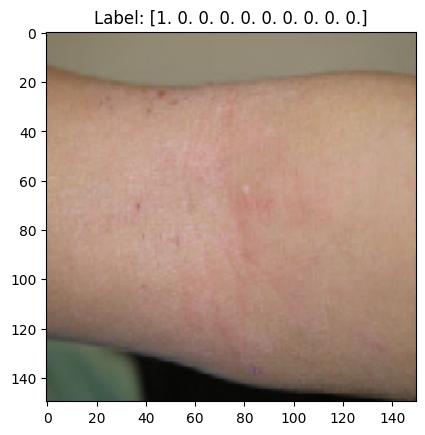

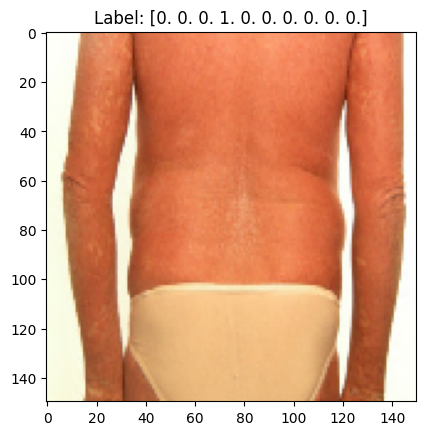

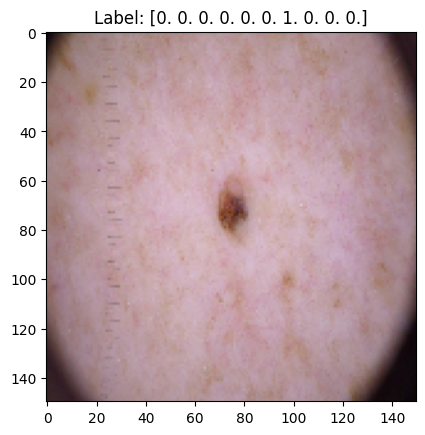

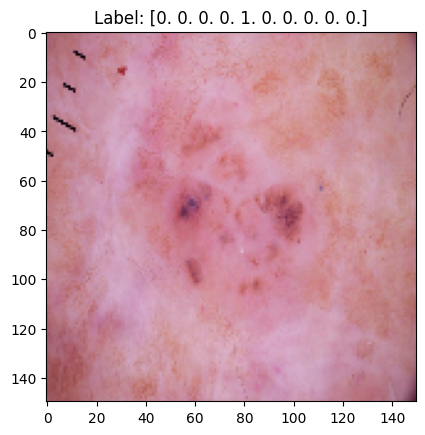

In [21]:
import matplotlib.pyplot as plt

# استخراج الصور والفئات من البيانات
images, labels = next(train_data)

# عرض أول 5 صور
for i in range(5):
    plt.imshow(images[i])
    plt.title(f"Label: {labels[i]}")
    plt.show()


In [22]:
import cv2
import os
import numpy as np

# تحديد مسار المجلد الرئيسي
main_dir = '/content/drive/My Drive/Colab Notebooks/D6/IMG_CLASSES'

# إنشاء قائمة لتخزين الصور والفئات
images = []
labels = []

# قراءة الصور من المجلدات
for category in os.listdir(main_dir):
    category_path = os.path.join(main_dir, category)
    if os.path.isdir(category_path):
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            try:
                # قراءة الصورة باستخدام OpenCV
                img = cv2.imread(img_path)

                # 1. تغيير حجم الصورة إلى (150x150)
                img_resized = cv2.resize(img, (150, 150))

                # 2. تحويل الصورة إلى درجات الرمادي (اختياري)
                img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

                # 3. تطبيع القيم إلى المدى [0, 1]
                img_normalized = img_resized / 255.0

                # تخزين الصورة والفئة
                images.append(img_normalized)
                labels.append(category)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")


In [23]:
from sklearn.preprocessing import LabelEncoder

# تحويل الفئات النصية إلى أرقام
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# عرض الفئات والأرقام المقابلة لها
print("Classes:", label_encoder.classes_)
print("Encoded Labels:", labels_encoded[:5])


Classes: ['1. Eczema 1677' '10. Warts Molluscum and other Viral Infections - 2103'
 '2. Melanoma 15.75k' '3. Atopic Dermatitis - 1.25k'
 '4. Basal Cell Carcinoma (BCC) 3323' '5. Melanocytic Nevi (NV) - 7970'
 '6. Benign Keratosis-like Lesions (BKL) 2624'
 '7. Psoriasis pictures Lichen Planus and related diseases - 2k'
 '8. Seborrheic Keratoses and other Benign Tumors - 1.8k'
 '9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k']
Encoded Labels: [0 0 0 0 0]


In [26]:
from sklearn.model_selection import train_test_split
import numpy as np

# تحويل الصور إلى numpy array إذا لم تكن موجودة بالفعل
images = np.array(images)
labels_encoded = np.array(labels_encoded)

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(
    images, labels_encoded, test_size=0.2, random_state=42
)

# عرض شكل المجموعات بعد التقسيم
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)


Training set shape: (318, 150, 150, 3)
Testing set shape: (80, 150, 150, 3)


In [27]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# عدد الفئات (الأمراض الجلدية)
num_classes = len(np.unique(y_train))

# بناء نموذج الشبكة العصبية
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # لتجنب overfitting
    Dense(num_classes, activation='softmax')  # الإخراج بعدد الفئات
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # لأن الفئات مشفرة كأرقام
              metrics=['accuracy'])
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,  # عدد الدورات
    batch_size=32,  # حجم الدفعات
    verbose=1
)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.1635 - loss: 2.4003 - val_accuracy: 0.3500 - val_loss: 2.0126
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.2773 - loss: 2.1910 - val_accuracy: 0.3875 - val_loss: 2.1135
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.2494 - loss: 2.1106 - val_accuracy: 0.4125 - val_loss: 1.8436
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.3101 - loss: 1.9444 - val_accuracy: 0.4250 - val_loss: 1.8016
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.3847 - loss: 1.7859 - val_accuracy: 0.4500 - val_loss: 1.6991
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.3850 - loss: 1.7217 - val_accuracy: 0.4875 - val_loss: 1.5922
Epoch 7/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.4088 - loss: 1.5497 - val_accuracy: 0.4375 - val_loss: 1.5198
Epoch 8/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.4456 - loss: 1.5008 - val_accuracy: 0.4625 - val_loss:

In [28]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 425ms/step - accuracy: 0.4602 - loss: 1.5528
Test Loss: 1.5245070457458496
Test Accuracy: 0.4749999940395355


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
Image: 0_2.jpg | Predicted Class: 7. Psoriasis pictures Lichen Planus and related diseases - 2k


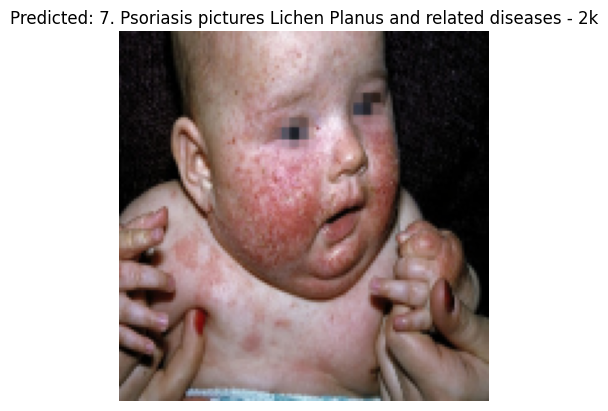

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Image: ISIC_6661073.jpg | Predicted Class: 2. Melanoma 15.75k


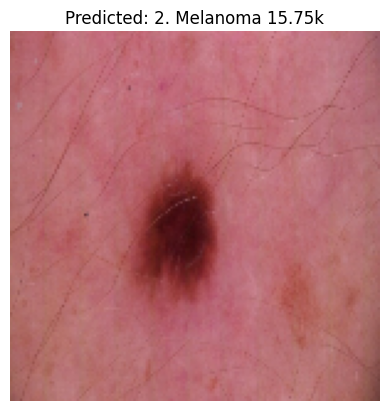

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Image: ISIC_6652978.jpg | Predicted Class: 2. Melanoma 15.75k


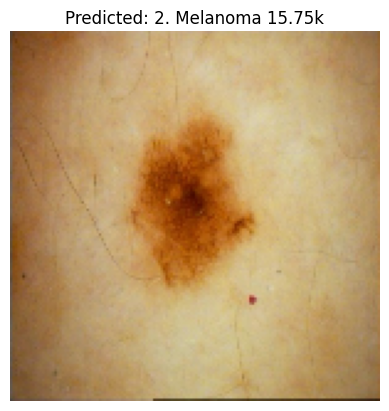

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Image: 0_44.jpg | Predicted Class: 7. Psoriasis pictures Lichen Planus and related diseases - 2k


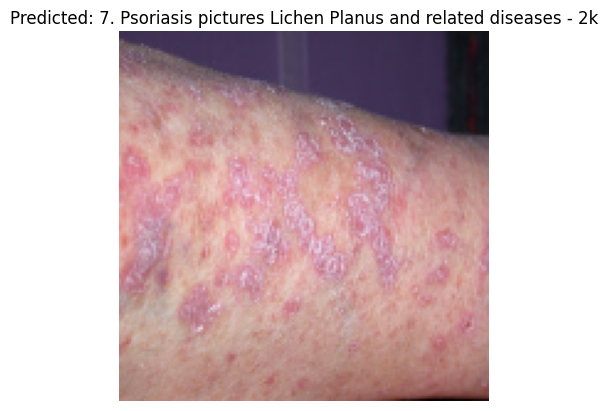

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Image: 0_0.jpg | Predicted Class: 1. Eczema 1677


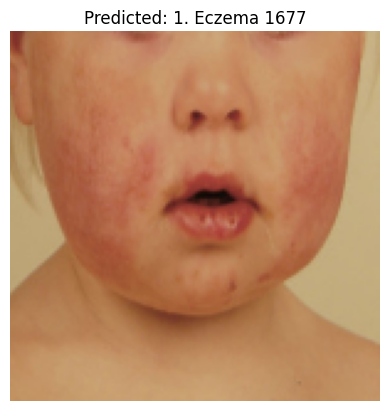

In [29]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

test_dir = '/content/drive/My Drive/Colab Notebooks/D6/TEST'

# قراءة الصور من المجلد
test_images = [img for img in os.listdir(test_dir) if img.endswith('.jpg')]

# إجراء التنبؤ لكل صورة
for img_name in test_images:
    # المسار الكامل للصورة
    img_path = os.path.join(test_dir, img_name)

    # قراءة الصورة
    image = cv2.imread(img_path)

    # معالجة الصورة (تغيير الحجم + التطبيع)
    image_resized = cv2.resize(image, (150, 150))
    image_normalized = image_resized / 255.0
    image_input = np.expand_dims(image_normalized, axis=0)  # تجهيز الشكل للإدخال

    # تنبؤ النموذج
    predictions = model.predict(image_input)
    predicted_class_index = np.argmax(predictions)
    predicted_class_label = label_encoder.classes_[predicted_class_index]

    # عرض النتائج
    print(f"Image: {img_name} | Predicted Class: {predicted_class_label}")

    # عرض الصورة مع النتيجة
    plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicted: {predicted_class_label}")
    plt.axis('off')
    plt.show()


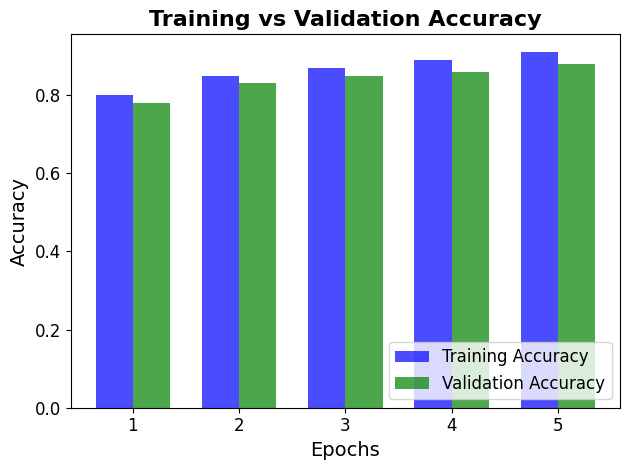

In [38]:
import numpy as np

epochs = range(1, len(train_accuracy) + 1)

x = np.array(epochs)
width = 0.35  # عرض الأعمدة

plt.bar(x - width/2, train_accuracy, width, label='Training Accuracy', color='b', alpha=0.7)
plt.bar(x + width/2, test_accuracy, width, label='Validation Accuracy', color='g', alpha=0.7)

plt.title("Training vs Validation Accuracy", fontsize=16, fontweight='bold')
plt.xlabel("Epochs", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.xticks(epochs, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=12)
plt.tight_layout()
plt.show()



In [40]:
import plotly.graph_objects as go

train_accuracy = [0.80, 0.85, 0.87, 0.89, 0.91]
test_accuracy = [0.78, 0.83, 0.85, 0.86, 0.88]
epochs = range(1, len(train_accuracy) + 1)

fig = go.Figure()

fig.add_trace(go.Scatter(x=list(epochs), y=train_accuracy, mode='lines+markers', name='Training Accuracy', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=list(epochs), y=test_accuracy, mode='lines+markers', name='Validation Accuracy', line=dict(color='green')))

fig.update_layout(
    title="Training vs Validation Accuracy",
    xaxis_title="Epochs",
    yaxis_title="Accuracy",
    template="plotly_dark"
)

fig.show()


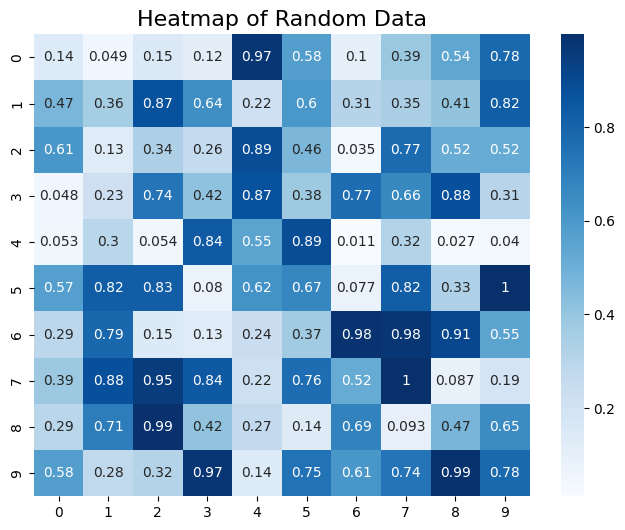

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# إنشاء مصفوفة عشوائية تمثل البيانات
data = np.random.rand(10, 10)

# رسم مخطط Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(data, annot=True, cmap='Blues', cbar=True)
plt.title("Heatmap of Random Data", fontsize=16)
plt.show()


In [32]:
!pip install gradio

import gradio as gr

# وظيفة لتحويل الصورة المدخلة وتجهيزها للنموذج
def process_image(image):
    image_resized = cv2.resize(image, (150, 150))
    image_normalized = image_resized / 255.0
    image_input = np.expand_dims(image_normalized, axis=0)
    return image_input

# وظيفة التنبؤ
def predict_disease(image):
    processed_image = process_image(image)
    predictions = model.predict(processed_image)
    predicted_class_index = np.argmax(predictions)
    predicted_class_label = label_encoder.classes_[predicted_class_index]
    return predicted_class_label

# واجهة المستخدم باستخدام Gradio
iface = gr.Interface(
    fn=predict_disease,
    inputs=gr.Image(),
    outputs="text",
    live=True,
    title="Skin Disease Diagnosis",
    description="Upload an image of the skin to diagnose the disease based on trained models.",
    css="""
        .footer {visibility: hidden;}
        .gradio-container {background-color: #f4f4f4; padding: 20px; border-radius: 15px;}
        .gr-button {background-color: #4CAF50; color: white; border-radius: 10px;}
        .gradio-input {border: 2px solid #4CAF50;}
        .gradio-output {font-size: 18px; font-weight: bold; color: #333;}
    """
)

iface.launch()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 87.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.0 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://d36b2ad778a84c15ca.gradio.live

This share link expires in 72 hours.